---
title: "A Guide to Bounding Box Formats and How to Draw Them"
description: "One of the hardest parts of object detection is making sure your bounding boxes are in the right format. Let's fix that."
author: "Daniel Bourke"
date: "2025-02-06"
categories: [object detection, data, computer vision, ml, ml projects]
image: "images/bounding-box-formats-blog-post-cover.jpg"
toc: true
toc-depth: 3
toc-expand: 2 # expand table of contents to multiple levels
---

![By the end of this post, we'll have replicated this plot. Extended caption: An annotated image showing a metal bin with a bounding box around it, displaying absolute bounding box coordinates in different formats (XYYX, XYWH, CXCWH). The image includes reference points, axis labels, and a gloved hand putting a piece of trash in the bin, with a background of stairs and a wall.](./images/absolute_bounding_box_coordinates_plot.png)

<a target="_blank" href="https://colab.research.google.com/github/mrdbourke/learn-ml/blob/main/posts/a-guide-to-bounding-box-formats/index.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a> 

> **Note:** You can run this notebook in [Google Colab](https://colab.research.google.com/github/mrdbourke/learn-ml/blob/main/posts/a-guide-to-bounding-box-formats/index.ipynb), however, just beware you'll have to [download the data](https://github.com/mrdbourke/learn-ml/tree/main/posts/a-guide-to-bounding-box-formats/data)/add an image to work with (these are available in the post).

## Introduction

One of the most confusing things about getting into bounding box detection is the number of different formats that bounding boxes come in.

That's one of the big troubles in machine learning in general: figuring out what format your data should be in.

I found this out whilst building an object detection model to power [Trashify](https://huggingface.co/spaces/mrdbourke/trashify_demo_v3), a small app which detects `bin`, `trash`, `hand` and gives you a point.

My model's loss was going down during training but the plotted boxes looked terrible.

Turns out I was trying to plot boxes in the wrong *format*.

In light of this, this post explores the different kinds of bounding box formats with various examples.

Let's start by going through different bounding box formats you might come across.

All of the following examples are based on an image with the dimenions `(960, 1280)` or a width of `960` pixels and a height of `1280` pixels.

Specifically, we'll be using this image (right click it download it if you'd like to follow along):

![The image we'll be using as an example throughout this post.](data/trashify_demo_image_for_box_format.jpeg)

And all boxes assume the `(0, 0)` coordinate is in the top left of the image.

## What is a bounding box?

The goal of an object detection model is locate an item (e.g. a person, car, licence plate, defect on a part, food on a plate) in an image.

One way to do this is to take an image, pass it through a computer vision model and then the model produces an output in the form `[class_name, x_min, y_min, x_max, y_max]` or `[class_name, x1, y1, x2, y2]` (this is two ways to write the same example format, there are more formats, we'll see these below).

Where:

* `class_name` = The classification of the target item (e.g. `"car"`, `"person"`, `"banana"`, `"piece_of_trash"`, this could be almost anything).
* `x_min` = The `x` value of the top left corner of the box.
* `y_min` = The `y` value of the top left corner of the box.
* `x_max` = The `x` value of the bottom right corner of the box.
* `y_max` = The `y` value of the bottom right corner of the box.

In our example, let's say we were trying to locate the `"bin"` in the image.

An example bounding box output from a computer vision model might look like the following:

* **Absolute** coordinate form: `["bin", 8.9, 275.3, 867.5, 964.0]` - Values are in the same format as the width and height dimensions. For example an `(x1, y1)` (or `(x_min, y_min)`) coordinate of `(8.9, 275.3)` means the top left corner is `8.9` pixels in on the x-axis, and `275.3` pixels down on the y-axis. (coordinates represent pixel values on the image).
* **Normalized** coordinate form: `["bin", 0.009, 0.215, 0.904, 0.753]` - Values are between `[0, 1]` and are proportions of the image width and height. For example a normalized `(x1, y1)` (or `(x_min, y_min)`) coordinate of `(0.009, 0.215)` means the top left corner is `0.009 * image_width` pixels in on the x-axis and `0.215 * image_height` down on the y-axis. To convert absolute coordinates to normalized, you can divide x-axis values by the image width and y-axis values by the image height.

$$
x_{\text{normalized}} = \frac{x_{\text{absolute}}}{\text{image\_width}} \quad y_{\text{normalized}} = \frac{y_{\text{absolute}}}{\text{image\_height}}
$$

How to train a model to produce these outputs is the topic of another blog post, for now, let's focus on the different bounding box formats.

## Different box formats

The following table contains a non-exhaustive list of some of the most common bounding box formats you'll come across in the wild.

| **Box format** | **Description** | **Absolute Example** | **Normalized Example** | **Source** |
| ----- | ----- | ----- | ----- | ----- |
| XYXY | Describes the top left corner coordinates `(x1, y1)` as well as the bottom right corner coordinates of a box. <br> Also referred to as: <br> `[x1, y1, x2, y2]`  <br> or <br> `[x_min, y_min, x_max, y_max]` | `[8.9, 275.3, 867.5, 964.0]` | `[0.009, 0.215, 0.904, 0.753]` | [PASCAL VOC Dataset](http://host.robots.ox.ac.uk/pascal/VOC/voc2012/htmldoc/devkit_doc.html#SECTION00053000000000000000) uses the absolute version of this format, [`torchvision.utils.draw_bounding_boxes`](https://pytorch.org/vision/main/generated/torchvision.utils.draw_bounding_boxes.html#draw-bounding-boxes) defaults to the absolute version of this format. |
| XYWH | Describes the top left corner coordinates `(x1, y1)` as well as the width (`box_width`) and height (`box_height`) of the target box. The bottom right corners `(x2, y2)` are found by adding the width and height to the top left corner coordinates `(x1 + box_width, y1 + box_height)`. <br> Also referred to as: <br> `[x1, y1, box_width, box_height]` <br> or <br> `[x_min, y_min, box_width, box_height]` | `[8.9, 275.3, 858.6, 688.7]` | `[0.009, 0.215, 0.894, 0.538]` | The [COCO (Common Objects in Context) dataset](https://cocodataset.org/#format-data) uses the absolute version of this format, see the section under "bbox". |
| CXCYWH | Describes the center coordinates of the bounding box `(center_x, center_y)` as well as the width (`box_width`) and height (`box_height`) of the target box. <br> Also referred to as: <br> `[center_x, center_y, box_width, box_height]` | `[438.2, 619.65, 858.6, 688.7]` | `[0.456, 0.484, 0.894, 0.538]` | Normalized version introduced in the [YOLOv3 (You Only Look Once) paper](https://arxiv.org/abs/1804.02767) and is used by many later forms of YOLO. |

## Which bounding box format should I use?

The bounding box format you use will depend on the framework, model and existing data you're trying to use.

For example, the take the following frameworks:

* **PyTorch** - If you're using PyTorch pre-trained models, for example, [`torchvision.models.detection.fasterrcnn_resnet50_fpn`](https://pytorch.org/vision/main/models/generated/torchvision.models.detection.fasterrcnn_resnet50_fpn.html#torchvision.models.detection.fasterrcnn_resnet50_fpn), you'll want **absolute** `XYXY` (`[x1, y1, x2, y2]`) format.
* **Hugging Face Transformers** - If you're using a Hugging Face Transformers model such as [Conditional DETR](https://huggingface.co/docs/transformers/main/en/model_doc/conditional_detr), you'll want to take note that [outputs from the model can be of one type](https://huggingface.co/docs/transformers/main/en/model_doc/conditional_detr#transformers.ConditionalDetrForObjectDetection.forward) (e.g. `CXCYWH`) but they can be [post-processed into another type](https://huggingface.co/docs/transformers/main/en/model_doc/conditional_detr#transformers.ConditionalDetrFeatureExtractor.post_process_object_detection) (e.g. **absolute** `XYXY`).
* **Ultralytics YOLO** - If you're using a YOLO-like model such as [Ultralytics YOLO](https://docs.ultralytics.com/datasets/detect/#ultralytics-yolo-format), you'll want **normalized** `CXCYWH` (`[center_x, center_y, width, height]`) format.
* **Google Gemini** - If you're using [Google Gemini to predict bounding boxes on your images](https://ai.google.dev/gemini-api/docs/vision?lang=python#bbox), then you'll want to pay attention to the special `[y_min, x_min, y_max, x_max]` (`YXYX`) normalized coordinates. 

Or if you note that someone has said their model is pre-trained on the COCO dataset, chances are the data has been formatted in `XYWH` format (see table above).

> **Note:** The examples above should only be rough guides. Always read the documentation with regards to what box format you should use. Keep in mind that although box format seems like a trivial thing, having the wrong box format can be the difference between a model that works and a model that doesn't. I've spent much time thinking my model was predicting poor boxes when it was actually just me plotting the wrong box format instead.

## Inspecting an example bounding box

Let's open a single bounding box annotation and check it out.

The following [sample](https://github.com/mrdbourke/learn-ml/blob/main/posts/a-guide-to-bounding-box-formats/data/trashify_demo_image_annotations.json) is a manually drawn bounding box using [Prodigy](https://prodi.gy/) (a labelling tool) on an [image](https://github.com/mrdbourke/learn-ml/blob/main/posts/a-guide-to-bounding-box-formats/data/trashify_demo_image_for_box_format.jpeg) of a person picking up a piece of trash (we'll see the image soon).

For now, let's inspect the file.

It comes in `.json` format, so we can open it with Python's `json` module.

> **Note:** Not all bounding box annotations will come in JSON format, this is just an example. You may get many labels in a big text file with one annotation per line. The point is that bounding box annotations usually come *separate* from the actual image itself.

In [1]:
import json

# Annotation from Prodigy (comes in XYWH format)
annotations_path = "data/trashify_demo_image_annotations.json"

# Open single annotation file
with open(annotations_path, "r") as f:
    annotations = json.load(f)

annotations

{'image_path': 'trashify_demo_image_for_box_format.jpeg',
 'file_name': '7c9b2934-23bc-46c5-8e9f-c2a66948b653.jpeg',
 'readme': 'Demo image for displaying box formats on. Box coordinates in annotations dict come in absolute XYWH format. Image size is in (height, width) format.',
 'annotations': [{'id': '4226a4fb-12b2-4e16-b29d-b33d667048d1',
   'label': 'bin',
   'color': 'magenta',
   'x': 8.9,
   'y': 275.3,
   'height': 688.7,
   'width': 858.6,
   'center': [438.2, 619.65],
   'type': 'rect',
   'points': [[8.9, 275.3], [8.9, 964], [867.5, 964], [867.5, 275.3]]}],
 'image_size': [1280, 960]}

Or in raw JSON (so you can copy it if you'd like): 

```json
{'image_path': 'trashify_demo_image_for_box_format.jpeg',
 'file_name': '7c9b2934-23bc-46c5-8e9f-c2a66948b653.jpeg',
 'readme': 'Demo image for displaying box formats on. Box coordinates in annotations dict come in absolute XYWH format. Image size is in (height, width) format.',
 'annotations': [{'id': '4226a4fb-12b2-4e16-b29d-b33d667048d1',
   'label': 'bin',
   'color': 'magenta',
   'x': 8.9,
   'y': 275.3,
   'height': 688.7,
   'width': 858.6,
   'center': [438.2, 619.65],
   'type': 'rect',
   'points': [[8.9, 275.3], [8.9, 964], [867.5, 964], [867.5, 275.3]]}],
 'image_size': [1280, 960]}
 ```


Woah!

A fair few things going on here.

But we get the following: 
* `image_path` - Path to the target image (I created this myself for simplicity but in practice you might use something like a unique identifier).
* `file_name` - A unique identifier for the image (UUID), we'd use something like this if we were to store many images in a database so they would all have different names.
* `readme` - Information about the image format (note: not all annotations will have this, I've created it to help for this example).
* `annotations` - A list of dictionaries containing various bounding box annotation(s) (in this case, only one) with a UUID for each annotation, coordinates for different points and `label` for the class name.
    * `x` and `y` - These are the top left corner coordinates of a target box (`[x1, y1]`).
* `image_size` - The original size of the image on which the bounding box was drawn in `[height, width]` format.

Comparing our `annotations` object with the table of different box formats above, it looks like we can extract the absolute `XYWH` format from the `annotations["annotations"]` key.

Let's try!

In [2]:
# Get annotations dictionary
annotations_dict = annotations["annotations"][0]

# Extract x, y, width, height
box_top_left_x = annotations_dict["x"]
box_top_left_y = annotations_dict["y"]
box_width = annotations_dict["width"]
box_height = annotations_dict["height"]

# Construct an array for an XYWH format box
box_xywh = [box_top_left_x, box_top_left_y, box_width, box_height]
print(f"[INFO] Box in XYWH format: {box_xywh}")

[INFO] Box in XYWH format: [8.9, 275.3, 858.6, 688.7]


Nice!

We've got a bounding box.

Right now it's just numbers (we'll get to plotting it on an image soon).

How about we try convert it to a different format?

We can do so manually, for example, by calculating how XYWH converts to XYXY or CXCYWH (this is a great exercise to try).

Or we can do so by using existing conversion utilities such as [`torchvision.ops.box_convert(boxes, in_fmt, out_fmt)`](https://pytorch.org/vision/main/generated/torchvision.ops.box_convert.html).

Where:
* `boxes` = a `torch.tensor` of boxes to convert.
* `in_fmt` = the input format of the input boxes (e.g. `xyxy`, `xywh` or `cxcywh`).
* `out_fmt` = the output format of the output boxes (e.g. `xyxy`, `xywh` or `cxcywh`).

Let's convert our existing `box_xywh` to the other formats.

In [3]:
import torch
from torchvision.ops import box_convert

# Convert XYWH to XYXY and CXCYWH
box_xyxy = box_convert(boxes=torch.tensor(box_xywh), in_fmt="xywh", out_fmt="xyxy")
box_cxcywh = box_convert(boxes=torch.tensor(box_xywh), in_fmt="xywh", out_fmt="cxcywh")

# Inspect our boxes
print(f"[INFO] Box in XYWH format: {box_xywh}")
print(f"[INFO] Box in XYXY format: {[round(x, 1) for x in box_xyxy.tolist()]}") # convert the tensor back to a list
print(f"[INFO] Box in CXCYWH format: {[round(x, 1) for x in box_cxcywh.tolist()]}")

[INFO] Box in XYWH format: [8.9, 275.3, 858.6, 688.7]
[INFO] Box in XYXY format: [8.9, 275.3, 867.5, 964.0]
[INFO] Box in CXCYWH format: [438.2, 619.7, 858.6, 688.7]


Perfect, now we've got the same box in three different formats.

Note that these formats are all absolute pixel values.

If we wanted to convert them to normalized values, we'd have to divide each `x` coordinate (including the `box_width`) by the image width and each `y` coordinate (including the `box_height`) by the image height.

To practice, let's now do all of the conversions above manually.

We'll also create the normalized version of each.

## Manually converting bounding box formats

Let's start with our existing bounding box in `XYWH` format and convert it to `XYXY` and `CXCYWH`.

In [4]:
# Our current box format is XYWH
print(f"[INFO] Current box in XYWH format: {box_xywh} ([x_min, y_min, box_width, box_height])")

[INFO] Current box in XYWH format: [8.9, 275.3, 858.6, 688.7] ([x_min, y_min, box_width, box_height])


To convert from `XYWH` (`[x_min, y_min, box_width, box_height]`) to `XYXY` (`[x_min, y_min, x_max, y_max]`) we can:

1. `x_min` and `y_min` remain the same.
2. Add the `box_width` to `x_min` to create `x_max`.
3. Add the `box_height` to `y_min` to create `y_max`. 

In [5]:
# Convert XYWH to XYXY (or [x_min, y_min, x_max, y_max])
box_xyxy = [0, 0, 0, 0] # start with zeros

# 1. x_min and y_min can remain the same
box_xyxy[0] = box_xywh[0] 
box_xyxy[1] = box_xywh[1]

# 2. Create x_max by adding x_min to box_width 
box_xyxy[2] = box_xywh[0] + box_xywh[2] 

# 3. Create y_max by adding y_min to box_height
box_xyxy[3] = box_xywh[1] + box_xywh[3] 

print(f"[INFO] Box in XYXY format: {box_xyxy}")

[INFO] Box in XYXY format: [8.9, 275.3, 867.5, 964.0]


Perfect! We get the same output as our previous conversion, except this time we did it by hand.

In practice, we'd probably avoid doing such a thing by hand and instead functionize it. 

But it's good to see how going between the different box formats can happen.

Let's do the same for going from `XYWH` (`[x_min, y_min, box_width, box_height]`) to `CXCYWH` ((`[center_x, center_y, box_width, box_height]`)).

To do so, we can:

1. Add `0.5 * box_width` to `x_min` to create `box_center_x` (we use `0.5` because the center is in the middle of the box).
2. Add `0.5 * box_height` to `y_min` to create `box_center_y`.
3. The `box_width` and `box_height` can remain the same as our `XYWH` box.

In [6]:
# Convert XYWH to CXCYWH (or [center_x, center_y, width, height])
box_cxcywh = [0, 0, 0, 0] # start with zeros

# 1. Create box_center_x by adding 0.5 * box_width to x_min
box_center_x = round(box_xywh[0] + (0.5 * box_xywh[2]), 1)
box_cxcywh[0] = box_center_x

# 2. Create box_center_y by adding 0.5 * box_height to y_min
box_center_y = round(box_xywh[1] + (0.5 * box_xywh[3]), 1)
box_cxcywh[1] = box_center_y 

# 3. The box_width and box_height can remain the same as our XYWH box
box_cxcywh[2] = box_xywh[2]
box_cxcywh[3] = box_xywh[3]

print(f"[INFO] Box in CXCYWH format: {box_cxcywh}")

[INFO] Box in CXCYWH format: [438.2, 619.7, 858.6, 688.7]


Beautiful!

We get the same coordinates for our `CXCYWH` box converting by hand as we did previously.

Again, for future use we'd probably functionize this to automatically go between different box formats.

## Creating normalized bounding box coordinates

All of our box coordinates so far have been in absolute format (exact pixel values such as `438.2`).

However, sometimes we'll find our boxes in normalized format.

Normalized format means that the values are:
* In the range `[0, 1]`.
* `x` coordinates have been divided by the image width.
* `y` coordinates have been divided by the image height.
* `box_width` has been divided by the image width.
* `box_height` has been divided by the image height.

Let's start by importing an image and getting its height and width.

[INFO] Image width, height: (960, 1280)


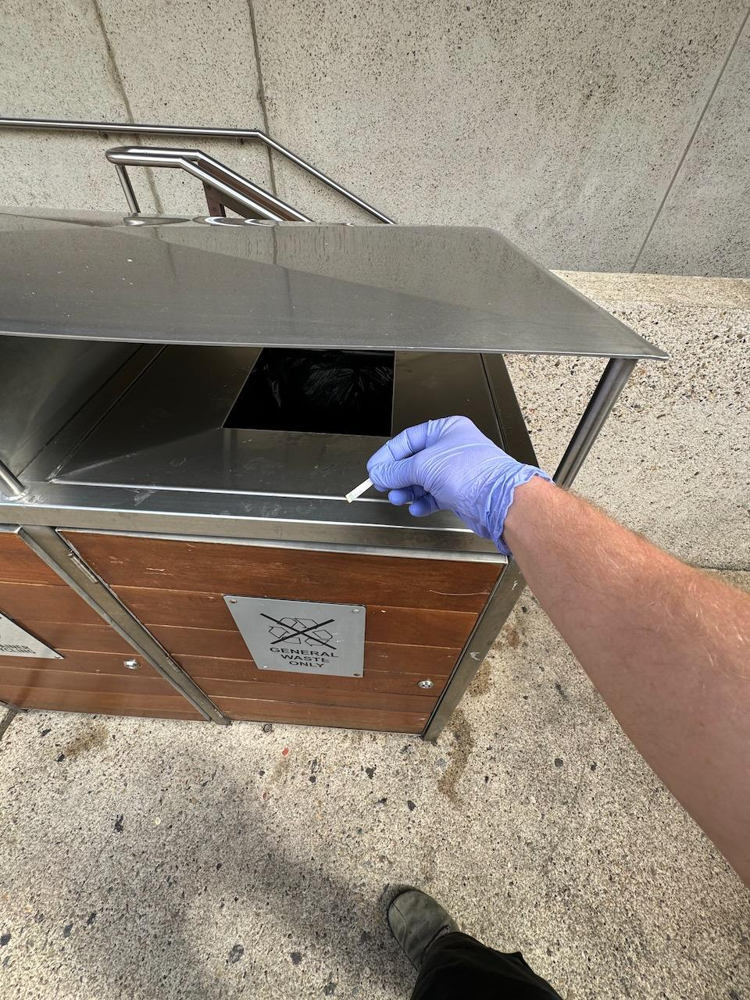

In [7]:
from PIL import Image 

# Image is a sample image from Trashify project: https://huggingface.co/spaces/mrdbourke/trashify_demo_v3 
image_path = "data/trashify_demo_image_for_box_format.jpeg"

# Open the image
image = Image.open(image_path)

# Get the image dimensions
img_width, img_height = image.size # PIL.Image.size comes in (width, height) order 

print(f"[INFO] Image width, height: {img_width, img_height}")

# Display the image
image

Wonderful!

It looks like someone is picking up a piece of trash and putting it in a bin (the image is from the [Trashify project](https://huggingface.co/spaces/mrdbourke/trashify_demo_v3) to detect when someone is putting a piece of trash in the bin).

We'll plot a bounding box on our image soon.

For now, we've also got our image width (`960` pixels) and image height (`1260` pixels).

We can use these dimensions to create our normalized coordinates.

To do so, we'll:

1. Divide `x` coordinates by the image width.
2. Divide `y` coordinates by the image height.
3. Divide `box_width` by the image width.
4. Divide `box_height` by the image height.

We'll round all values to 3 decimal places (to prevent values of `0.009270833333333334`, this is less precise but looks cleaner).

In [8]:
# 1. Divide x coordiantes by the image width
box_top_left_x_normalized = round(box_top_left_x / img_width, 3)
box_bottom_right_x_normalized = round((box_top_left_x + box_width) / img_width, 3) # (x_min + box_width) / img_width
box_center_x_normalized = round(box_center_x / img_width, 3)

# 2. Divide y coordinates by the image height
box_top_left_y_normalized = round(box_top_left_y / img_height, 3)
box_bottom_right_y_normalized = round((box_top_left_y + box_height) / img_height, 3) # (y_min + box_height) / img_height
box_center_y_normalized = round(box_center_y / img_height, 3)

# 3. Divide box_width by the image width
box_width_normalized = round(box_width / img_width, 3)

# 4. Divide box_height by the image height
box_height_normalized = round(box_height / img_height, 3)

print(f"[INFO] Box x coordinates normalized:")
print(f"[INFO] Box top left x normalized (x_min): {box_top_left_x_normalized}")
print(f"[INFO] Box bottom right x normalized (x_max): {box_bottom_right_x_normalized}")
print(f"[INFO] Box center x normalized (center_x): {box_center_x_normalized}\n")

print(f"[INFO] Box y coordinates normalized:")
print(f"[INFO] Box top left y normalized (y_min): {box_top_left_y_normalized}")
print(f"[INFO] Box bottom right y normalized (y_max): {box_bottom_right_y_normalized}")
print(f"[INFO] Box center y normalized (center_y): {box_center_y_normalized}\n")

print(f"[INFO] Box height and width normalized:")
print(f"[INFO] Box width normalized: {box_width_normalized}")
print(f"[INFO] Box height normalized: {box_height_normalized}")

[INFO] Box x coordinates normalized:
[INFO] Box top left x normalized (x_min): 0.009
[INFO] Box bottom right x normalized (x_max): 0.904
[INFO] Box center x normalized (center_x): 0.456

[INFO] Box y coordinates normalized:
[INFO] Box top left y normalized (y_min): 0.215
[INFO] Box bottom right y normalized (y_max): 0.753
[INFO] Box center y normalized (center_y): 0.484

[INFO] Box height and width normalized:
[INFO] Box width normalized: 0.894
[INFO] Box height normalized: 0.538


Outstanding!

Using these normalized coordinates, let's create normalized versions of our `XYWH`, `XYXY` and `CXCYWH` boxes.

In [9]:
# Create normalized XYWH box ([x_min, y_min, box_width, box_height])
box_xywh_normalized = [box_top_left_x_normalized, box_top_left_y_normalized, box_width_normalized, box_height_normalized]

# Create normalized XYXY box ([x_min, y_min, x_max, y_max])
box_xyxy_normalized = [box_top_left_x_normalized, box_top_left_y_normalized, box_bottom_right_x_normalized, box_bottom_right_y_normalized]

# Create normalized CXCYWH box ([center_x, center_y, box_width, box_height])
box_cxcywh_normalized = [box_center_x_normalized, box_center_y_normalized, box_width_normalized, box_height_normalized]

print(f"[INFO] Box XYWH format normalized: {box_xywh_normalized}")
print(f"[INFO] Box XYXY format normalized: {box_xyxy_normalized}")
print(f"[INFO] Box CXCYWH format normalized: {box_cxcywh_normalized}")

[INFO] Box XYWH format normalized: [0.009, 0.215, 0.894, 0.538]
[INFO] Box XYXY format normalized: [0.009, 0.215, 0.904, 0.753]
[INFO] Box CXCYWH format normalized: [0.456, 0.484, 0.894, 0.538]


Phew!

That was a lot of converting and coordinate manipulating.

Thankfully, much of this conversion will often be taken care of behind the scenes.

We spent some time practicing this conversion so we know how to interpolate different box coordinates if we ever need to.

How about we finally see what these coordinates look like on an image?

## Drawing bounding boxes on images

So far we've been dealing with arrays of numbers.

It would be good to see how these actuall look on an image.

With that being said, let's draw some boxes!

There are a couple of ways we can draw boxes on images with Python:

1. Use [`PIL.ImageDraw.rectangle`](https://pillow.readthedocs.io/en/stable/reference/ImageDraw.html#PIL.ImageDraw.ImageDraw.rectangle), which takes in box coordinates in the form `XYXY`. We can add text to the image (for the class name) using [`PIL.ImageDraw.text`](https://pillow.readthedocs.io/en/stable/reference/ImageDraw.html#PIL.ImageDraw.ImageDraw.text).
2. Use [`matplotlib.patches.Rectangle`](https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html), which takes in an anchor point `xy` (e.g. the top left corner coordinates of a box) as well as a `width` and `height` parameter of how big the box is. We can add text to our `matplotlib` plot via [`matplotlib.pyplot.text`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.text.html).
3. Use [`torch.utils.draw_bounding_boxes`](https://pytorch.org/vision/main/generated/torchvision.utils.draw_bounding_boxes.html) which takes in an image tensor and boxes in the form `XYXY` (`[x_min, y_min, x_max, y_max]`).

How about we try each?

First we'll set up a couple of variables we can reuse.

In [10]:
# Get the box label from the annotations dictionary
box_label = annotations_dict["label"]

# Get the box colour from the annotations dictionary
box_colour = annotations_dict["color"]

print(f"[INFO] Box lable: {box_label}")
print(f"[INFO] Box colour: {box_colour}")

[INFO] Box lable: bin
[INFO] Box colour: magenta


### Drawing a good bounding box with `PIL`

Let's use the `PIL.ImageDraw.rectangle` method to draw a box on our `PIL.Image`.

[INFO] Drawing box: [8.9, 275.3, 867.5, 964.0] (XYXY), label: bin


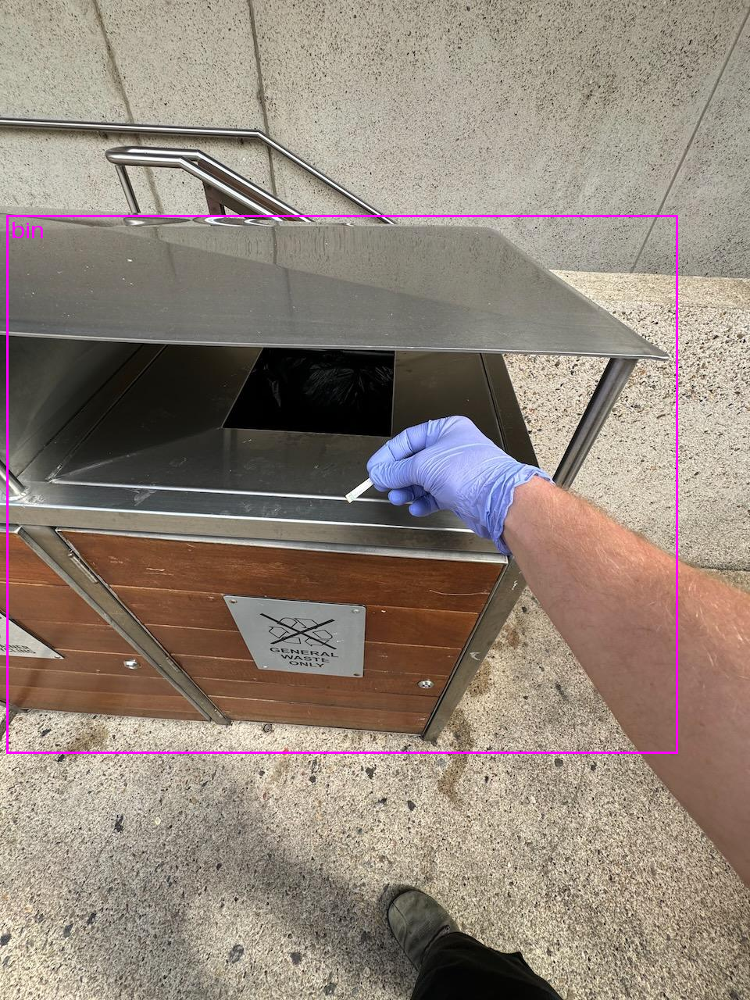

In [11]:
from PIL import Image, ImageDraw, ImageFont

# Image is a sample image from Trashify project: https://huggingface.co/spaces/mrdbourke/trashify_demo_v3 
image_path = "data/trashify_demo_image_for_box_format.jpeg"

# Open the image
image = Image.open(image_path)

# Create a draw object and get the image font 
draw = ImageDraw.Draw(image)
font = ImageFont.load_default(size=30)

# The rectangle method takes boxes in XYXY format
print(f"[INFO] Drawing box: {box_xyxy} (XYXY), label: {box_label}")
draw.rectangle(
    xy=box_xyxy, 
    outline=box_colour,
    width=3
)

# Add text to the box to showcase the label name
draw.text(
    xy=(box_top_left_x + 5, box_top_left_y),
    text=box_label,
    fill=box_colour,
    font=font
)

del draw

image

Nice! Looks like the bounding box fits the `bin` nicely.

Now wouldn't it be also good to visualize some of the coordinates we've been working with on the box?

### Drawing a poor bounding box with `PIL`

Now what if we passed in the wrong box format to our drawing code? 

For example, we tried to plot a box in `CXCYWH` format instead of `XYXY`?

[INFO] Drawing box: [438.2, 619.7, 858.6, 688.7] (CXCYWH), label: bin


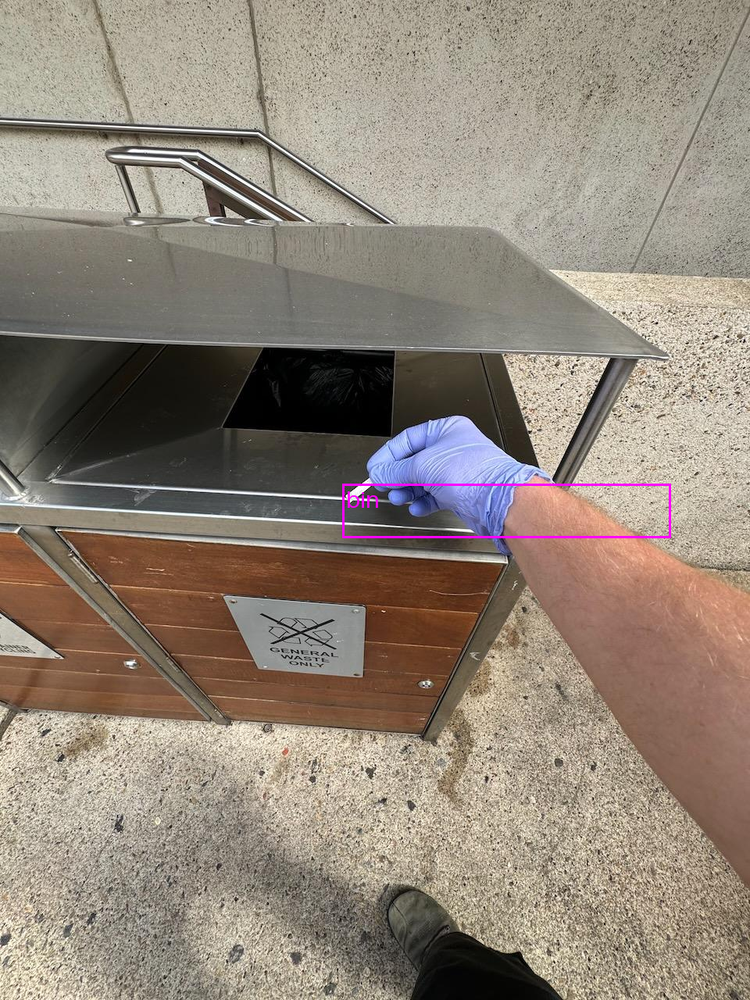

In [12]:
from PIL import Image, ImageDraw, ImageFont

# Image is a sample image from Trashify project: https://huggingface.co/spaces/mrdbourke/trashify_demo_v3 
image_path = "data/trashify_demo_image_for_box_format.jpeg"

# Open the image
image = Image.open(image_path)

# Create a draw object and get the image font 
draw = ImageDraw.Draw(image)
font = ImageFont.load_default(size=30)

# The rectangle method takes boxes in XYXY format but let's see what happens when we use CXCYWH
print(f"[INFO] Drawing box: {box_cxcywh} (CXCYWH), label: {box_label}")
draw.rectangle(
    xy=box_cxcywh, 
    outline=box_colour,
    width=3
)

# Add text to the box to showcase the label name (we'll make sure this is CXCYWH too)
draw.text(
    xy=(box_center_x + 5, box_center_y),
    text=box_label,
    fill=box_colour,
    font=font
)

del draw

image

Oh no!

That box doesn't look very good... 

It's the same box as before but in a different format (`CXCYWH` rather than `XYXY`).

This is a great example of how a slight format change can make you believe that the boxes you're plotting are of poor quality.

Keep this in mind the next time you're bounding boxes aren't looking correct, ask yourself, are they in the right format?

### Drawing bounding boxes with `maptlotlib` 

Time to get a bit more creative.

Let's draw the same bounding box as above, except this time we'll add a bit more information about the box.

Things such as `box_height`, `box_width`, coordinates and more.

When using `matplotlib`, we can:
* Show images with [`matplotlib.pyplot.imshow`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html).
* Show rectangles with [`matplotlib.patches.Rectangle`](https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html).
* Show text with [`matplotlib.pyplot.text`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.text.html).
* Draw arrows with [`matplotlib.pyplot.annotate`](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.annotate.html).

How about we combine all of these and make a nice annotated plot of our bounding box?

> **Note:** All coordinates in the following plots/images are listed in (x, y) format. Meaning the x-value comes first, followed by the y-value. Also, the following plot(s) took a fairly large amount of trial and error to get looking just right. So don't worry too much if it takes you a while to replicate something similar.

First, we'll create some values we can reuse.

In [13]:
# Set sizing and colour options
CIRCLE_SIZE = 75
CIRCLE_COLOUR = "green"

And now let's make an epic plot!

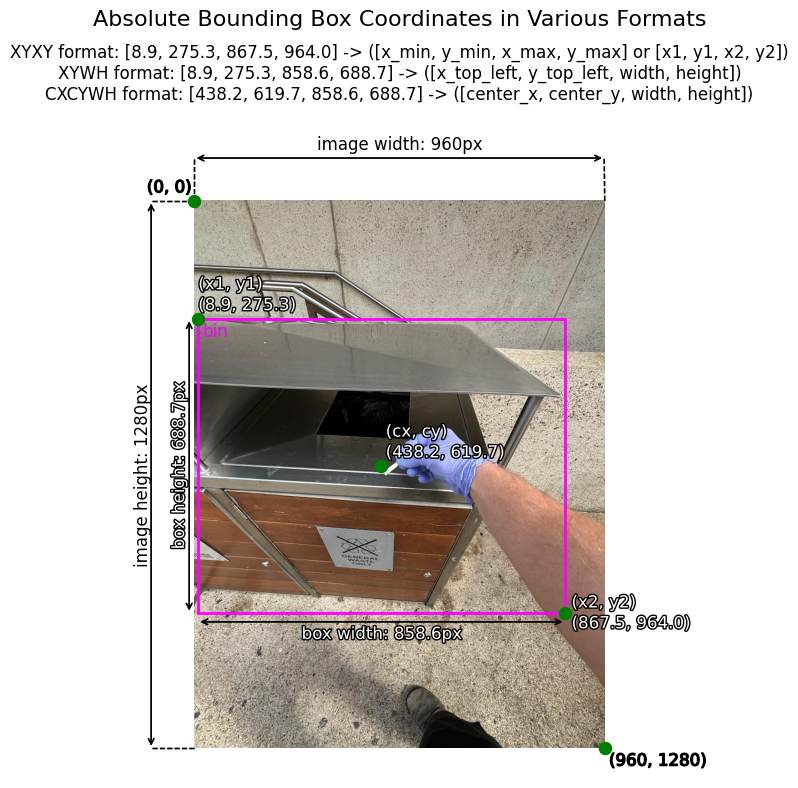

In [14]:
#| code-fold: true

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import patheffects
from PIL import Image
import numpy as np

# Read image
img = Image.open(image_path)
img_width, img_height = img.size
img_array = np.array(img)

# Create figure and axis with larger figure size
fig, ax = plt.subplots(figsize=(12, 8))

# Display the image
ax.imshow(img_array)

# Add padding around the image (in pixels)
padding = 150
ax.set_xlim(-padding, img_array.shape[1] + padding)

# Create rectangle patch
rect = patches.Rectangle(
    (box_top_left_x, 
     box_top_left_y),
    box_width,
    box_height,
    linewidth=2,
    edgecolor=box_colour,
    facecolor='none'
)

# Add rectangle to plot
ax.add_patch(rect)

### Add height/width image measurement lines ###

# Draw stretching lines from corners to measurement zone
# Style for dashed lines
dash_style = {
    'color': 'black',
    'linestyle': '--',
    'linewidth': 1,
    'path_effects': [patheffects.withStroke(linewidth=1, foreground='black')]
}

# Draw horizontal extension lines
left_x = -100  # Position in padding zone
ax.plot(
    [0, left_x], 
    [0, 0],
    **dash_style
)
ax.plot(
    [0, left_x], 
    [img_height, img_height],
    **dash_style
)

# Draw vertical extension lines
top_y = -100  # Position in padding zone
ax.plot(
    [0, 0], 
    [0, top_y],
    **dash_style
)
ax.plot(
    [img_width, img_width-1], 
    [0, top_y],
    **dash_style
)

# Draw measurement arrows in padding zone
# Vertical measurement
ax.annotate(
    '',
    xy=(left_x, img_height),
    xytext=(left_x, 0),
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# Horizontal measurement
ax.annotate(
    '',
    xy=(img_width, top_y),
    xytext=(0, top_y),
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# -> Add measurement labels
# Image height text
ax.text(
    -140, # x pos
    img_height/2, # y pos
    f'image height: {img_height}px',
    rotation=90,
    verticalalignment='center',
    fontsize=12, 
    color='black',
    # path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)

# Image width text
ax.text(
    img_width/2, # x pos
    -120, # y pos
    f'image width: {img_width}px',
    horizontalalignment='center',
    fontsize=12,
    color='black',
    # path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)

### End: Add height/width image measurement lines ###

### Image corner circles ###

# Add circle using scatter plot - (0, 0) 
ax.scatter(
    [0], 
    [0], 
    color=CIRCLE_COLOUR,  # Circle color
    s=CIRCLE_SIZE,  # Size of circle
    zorder=5  # Make sure it's drawn on top
)

# Add circle using scatter plot - (img_width, img_height) 
ax.scatter(
    [img_width], 
    [img_height], 
    color=CIRCLE_COLOUR,  # Circle color
    s=CIRCLE_SIZE,  # Size of circle
    zorder=5  # Make sure it's drawn on top
)

# Add coordinates text to 0, 0
ax.text(
    -110, 
    -20,
    f"(0, 0)",
    color='black',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(
            linewidth=1, 
            foreground='black'
        )
    ]
)

# Add coordinates text to img_width, img_height
ax.text(
    img_width + 10, 
    img_height +40,
    f"({img_width}, {img_height})",
    color='black',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(
            linewidth=1, 
            foreground='black'
        )
    ]
)

### END: Image corner circles 

#############################

### Start: Box stroke drawings ###
# Draw width measurement line
offset = 20  # pixels offset from the box
# Draw the width arrow
ax.annotate(
    '',
    xy=(box_top_left_x + box_width, box_top_left_y + box_height + offset),  # arrow head
    xytext=(box_top_left_x, box_top_left_y + box_height + offset),  # arrow tail
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)
# Add width label
ax.text(
    box_top_left_x + box_width/2,  # center of width
    box_top_left_y + box_height + offset + 40,  # above the arrow
    f'box width: {box_width}px',
    color='white',
    fontsize=12,
    horizontalalignment='center',
    path_effects=[patheffects.withStroke(linewidth=2, foreground='black')]
)

# Draw height measurement line
offset_x = 20  # pixels offset from the box
# Draw the height arrow
ax.annotate(
    '',
    xy=(box_top_left_x - offset_x, box_top_left_y + box_height),  # arrow head
    xytext=(box_top_left_x - offset_x, box_top_left_y),  # arrow tail
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)
# Add box height label
ax.text(
    box_top_left_x - offset_x - 45,  # left of the arrow
    box_top_left_y + box_height/2,  # center of height
    f'box height: {box_height}px',
    color='white',
    fontsize=12,
    verticalalignment='center',
    rotation=90,
    path_effects=[patheffects.withStroke(linewidth=2, 
                                         foreground='black')]
)

# Add box label annotation
ax.text(
    box_top_left_x + 10, 
    box_top_left_y + 40,
    box_label,
    color=box_colour,
    fontsize=12,
)

### End: Box stroke drawings ###

### Box Corner circles ###
# Add circle using scatter plot - (x1, y1)
ax.scatter(
    [box_top_left_x], 
    [box_top_left_y], 
    color=CIRCLE_COLOUR,  # Circle color
    s=CIRCLE_SIZE,  # Size of circle
    zorder=5  # Make sure it's drawn on top
)

# Add circle using scatter plot - (x2, y2) 
ax.scatter(
    [box_top_left_x + box_width], 
    [box_top_left_y + box_height], 
    color=CIRCLE_COLOUR,  # Circle color
    s=CIRCLE_SIZE,  # Size of circle
    zorder=5  # Make sure it's drawn on top
)

# Add coordinates text to x1, y1
ax.text(
    0+10, 
    box_top_left_y - 20,
    f"(x1, y1)\n({box_top_left_x}, {box_top_left_y})",
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(
            linewidth=2, 
            foreground='black'
        )
    ]
)

# Add coordinates text to x2, y2
ax.text(
    box_top_left_x + box_width + 15, 
    box_top_left_y + box_height + 35,
    f"(x2, y2)\n({box_top_left_x + box_width}, {box_top_left_y + box_height})",
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(
            linewidth=2, 
            foreground='black'
        )
    ]
)
### End: Box Corner Circles ###

### Start: Box Center Circle ###
# Add circle using scatter plot - (cx, cy)
ax.scatter(
    [box_center_x], 
    [box_center_y], 
    color=CIRCLE_COLOUR,  # Circle color
    s=CIRCLE_SIZE,  # Size of circle
    zorder=5  # Make sure it's drawn on top
)

# Add coordinates text to x1, y1
ax.text(
    box_center_x + 10, 
    box_center_y - 20,
    f"(cx, cy)\n({box_center_x}, {box_center_y})",
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(
            linewidth=2, 
            foreground='black'
        )
    ]
)
### End: Box Center Circles ###

# Remove axes
ax.set_axis_off()

plt.suptitle("""Absolute Bounding Box Coordinates in Various Formats""", fontsize=16)

plt.title(f"""XYXY format: {box_xyxy} -> ([x_min, y_min, x_max, y_max] or [x1, y1, x2, y2])
XYWH format: {box_xywh} -> ([x_top_left, y_top_left, width, height])
CXCYWH format: {box_cxcywh} -> ([center_x, center_y, width, height])
""")

# Adjust layout to ensure everything fits
plt.tight_layout()

# Save the plot
plt.savefig("images/absolute_bounding_box_coordinates_plot.png")

# Show plot
plt.show()

Woah! Now that's a well-informed bounding box plot.

Notice how each of the different bounding box formats could be plotted.

From `XYXY` using the top left and bottom right green corners.

To `CXCYWH` using the center point as well as the width and height of the bounding box.

How about we reproduce the same plot, except this time we'll use the normalized coordinates of the boxes?

First, we'll remind ourselves of the normalized coordinates (like all good machine learning cooking shows, we prepared these earlier). 

In [15]:
print(f"[INFO] XYXY absolute, normalized: {box_xyxy, box_xyxy_normalized}")
print(f"[INFO] XYWH absolute, normalized: {box_xywh, box_xywh_normalized}")
print(f"[INFO] CXCYWH absolute, normalized: {box_cxcywh, box_cxcywh_normalized}")

[INFO] XYXY absolute, normalized: ([8.9, 275.3, 867.5, 964.0], [0.009, 0.215, 0.904, 0.753])
[INFO] XYWH absolute, normalized: ([8.9, 275.3, 858.6, 688.7], [0.009, 0.215, 0.894, 0.538])
[INFO] CXCYWH absolute, normalized: ([438.2, 619.7, 858.6, 688.7], [0.456, 0.484, 0.894, 0.538])


Now time to replicate the plot above, except this time with normalized values.

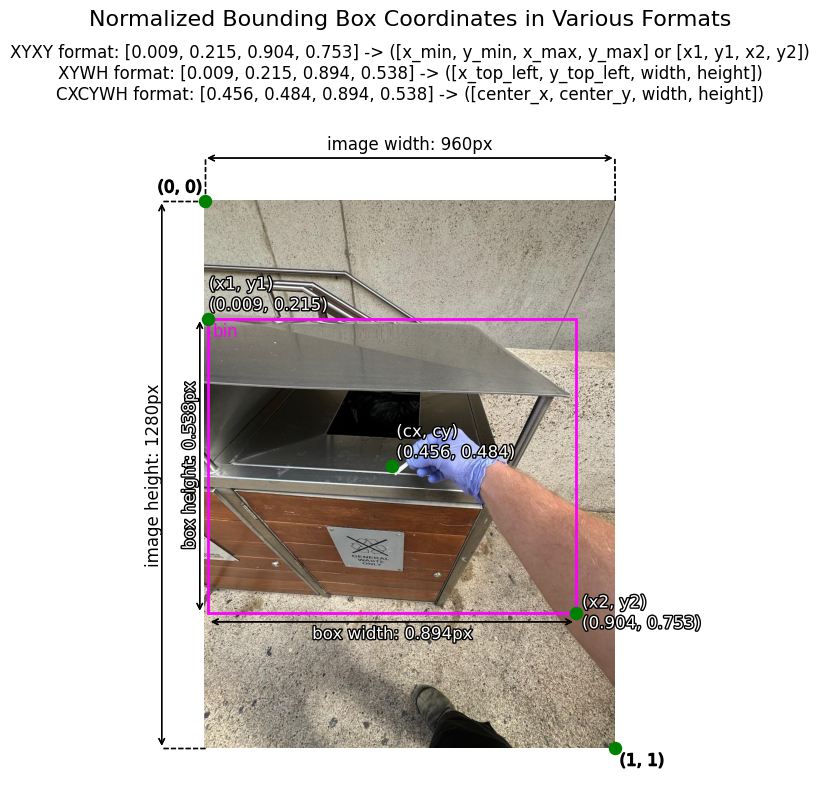

In [16]:
#| code-fold: true

# Create figure and axis with larger figure size
fig, ax = plt.subplots(figsize=(12, 8))

# Display the image
ax.imshow(img_array)

# Add padding around the image (in pixels)
padding = 150
ax.set_xlim(-padding, img_array.shape[1] + padding)

# Create rectangle patch
rect = patches.Rectangle(
    (box_top_left_x, 
     box_top_left_y),
    box_width,
    box_height,
    linewidth=2,
    edgecolor=box_colour,
    facecolor='none'
)

# Add rectangle to plot
ax.add_patch(rect)

### Add height/width image measurement lines ###

# Draw stretching lines from corners to measurement zone
# Style for dashed lines
dash_style = {
    'color': 'black',
    'linestyle': '--',
    'linewidth': 1,
    'path_effects': [patheffects.withStroke(linewidth=1, foreground='black')]
}

# Draw horizontal extension lines
left_x = -100  # Position in padding zone
ax.plot(
    [0, left_x], 
    [0, 0],
    **dash_style
)
ax.plot(
    [0, left_x], 
    [img_height, img_height],
    **dash_style
)

# Draw vertical extension lines
top_y = -100  # Position in padding zone
ax.plot(
    [0, 0], 
    [0, top_y],
    **dash_style
)
ax.plot(
    [img_width, img_width-1], 
    [0, top_y],
    **dash_style
)

# Draw measurement arrows in padding zone
# Vertical measurement
ax.annotate(
    '',
    xy=(left_x, img_height),
    xytext=(left_x, 0),
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# Horizontal measurement
ax.annotate(
    '',
    xy=(img_width, top_y),
    xytext=(0, top_y),
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)

# -> Add measurement labels
# Image height text
ax.text(
    -140, # x pos
    img_height/2, # y pos
    f'image height: {img_height}px',
    rotation=90,
    verticalalignment='center',
    fontsize=12, 
    color='black',
    # path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)

# Image width text
ax.text(
    img_width/2, # x pos
    -120, # y pos
    f'image width: {img_width}px',
    horizontalalignment='center',
    fontsize=12,
    color='black',
    # path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
)

### End: Add height/width image measurement lines ###

### Image corner circles ###

# Add circle using scatter plot - (0, 0) 
ax.scatter(
    [0], 
    [0], 
    color=CIRCLE_COLOUR,  # Circle color
    s=CIRCLE_SIZE,  # Size of circle
    zorder=5  # Make sure it's drawn on top
)

# Add circle using scatter plot - (img_width, img_height) 
ax.scatter(
    [img_width], 
    [img_height], 
    color=CIRCLE_COLOUR,  # Circle color
    s=CIRCLE_SIZE,  # Size of circle
    zorder=5  # Make sure it's drawn on top
)

# Add coordinates text to 0, 0
ax.text(
    -110, 
    -20,
    f"(0, 0)",
    color='black',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(
            linewidth=1, 
            foreground='black'
        )
    ]
)

# Add coordinates text to img_width, img_height
ax.text(
    img_width + 10, 
    img_height + 40,
    f"(1, 1)",
    color='black',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(
            linewidth=1, 
            foreground='black'
        )
    ]
)

### END: Image corner circles 

#############################

### Start: Box stroke drawings ###
# Draw width measurement line
offset = 20  # pixels offset from the box
# Draw the width arrow
ax.annotate(
    '',
    xy=(box_top_left_x + box_width, box_top_left_y + box_height + offset),  # arrow head
    xytext=(box_top_left_x, box_top_left_y + box_height + offset),  # arrow tail
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)
# Add width label
ax.text(
    box_top_left_x + box_width/2,  # center of width
    box_top_left_y + box_height + offset + 40,  # above the arrow
    f'box width: {box_width_normalized}px',
    color='white',
    fontsize=12,
    horizontalalignment='center',
    path_effects=[patheffects.withStroke(linewidth=2, foreground='black')]
)

# Draw height measurement line
offset_x = 20  # pixels offset from the box
# Draw the height arrow
ax.annotate(
    '',
    xy=(box_top_left_x - offset_x, box_top_left_y + box_height),  # arrow head
    xytext=(box_top_left_x - offset_x, box_top_left_y),  # arrow tail
    arrowprops=dict(
        arrowstyle='<->',
        color='black',
        linewidth=1,
        path_effects=[patheffects.withStroke(linewidth=1, foreground='black')]
    )
)
# Add box height label
ax.text(
    box_top_left_x - offset_x - 45,  # left of the arrow
    box_top_left_y + box_height/2,  # center of height
    f'box height: {box_height_normalized}px',
    color='white',
    fontsize=12,
    verticalalignment='center',
    rotation=90,
    path_effects=[patheffects.withStroke(linewidth=2, 
                                         foreground='black')]
)

# Add box label annotation
ax.text(
    box_top_left_x + 10, 
    box_top_left_y + 40,
    box_label,
    color=box_colour,
    fontsize=12,
)

### End: Box stroke drawings ###

### Box Corner circles ###
# Add circle using scatter plot - (x1, y1)
ax.scatter(
    [box_top_left_x], 
    [box_top_left_y], 
    color=CIRCLE_COLOUR,  # Circle color
    s=CIRCLE_SIZE,  # Size of circle
    zorder=5  # Make sure it's drawn on top
)

# Add circle using scatter plot - (x2, y2) 
ax.scatter(
    [box_top_left_x + box_width], 
    [box_top_left_y + box_height], 
    color=CIRCLE_COLOUR,  # Circle color
    s=CIRCLE_SIZE,  # Size of circle
    zorder=5  # Make sure it's drawn on top
)

# Add coordinates text to x1, y1
ax.text(
    0+10, 
    box_top_left_y - 20,
    f"(x1, y1)\n({box_top_left_x_normalized}, {box_top_left_y_normalized})",
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(
            linewidth=2, 
            foreground='black'
        )
    ]
)

# Add coordinates text to x2, y2
ax.text(
    box_top_left_x + box_width + 15, 
    box_top_left_y + box_height + 35,
    f"(x2, y2)\n({box_bottom_right_x_normalized}, {box_bottom_right_y_normalized})",
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(
            linewidth=2, 
            foreground='black'
        )
    ]
)
### End: Box Corner Circles ###

### Start: Box Center Circle ###
# Add circle using scatter plot - (cx, cy)
ax.scatter(
    [box_center_x], 
    [box_center_y], 
    color=CIRCLE_COLOUR,  # Circle color
    s=CIRCLE_SIZE,  # Size of circle
    zorder=5  # Make sure it's drawn on top
)

# Add coordinates text to x1, y1
ax.text(
    box_center_x + 10, 
    box_center_y - 20,
    f"(cx, cy)\n({box_center_x_normalized}, {box_center_y_normalized})",
    color='white',
    fontsize=12,
    path_effects=[
        patheffects.withStroke(
            linewidth=2, 
            foreground='black'
        )
    ]
)
### End: Box Center Circles ###

# Remove axes
ax.set_axis_off()

# Add super title and title
plt.suptitle("""Normalized Bounding Box Coordinates in Various Formats""", fontsize=16)
plt.title(f"""XYXY format: {box_xyxy_normalized} -> ([x_min, y_min, x_max, y_max] or [x1, y1, x2, y2])
XYWH format: {box_xywh_normalized} -> ([x_top_left, y_top_left, width, height])
CXCYWH format: {box_cxcywh_normalized} -> ([center_x, center_y, width, height])
""")

# Adjust layout to ensure everything fits
plt.tight_layout()

# Save the plot
plt.savefig("images/normalized_bounding_box_coordinates_plot.png")

# Show plot
plt.show()

Beautiful!

Notice how this time the bottom right corner of the image is at coordinate `(1, 1)`?

This is because thanks to normalization, all values are now proportions of the image height and image width.

### Drawing bounding boxes with `torchvision`

If you're building an object dectection model with `torch` and `torchvision`, it can be handy to be able to draw boxes on your images directly with `torchvision`.

To do so, we can use [`torchvision.utils.draw_bounding_boxes`](https://pytorch.org/vision/main/generated/torchvision.utils.draw_bounding_boxes.html), this method requires boxes in `XYXY` format and returns a `torch.tensor` (don't worry, we can convert this to back to an image).

Some things to note:

* `torchvision` expects our boxes and image to be in `torch.tensor` format.
* We can convert our `PIL.Image` to a `torch.tensor` using [`torchvision.transforms.functional.pil_to_tensor`](https://pytorch.org/vision/main/generated/torchvision.transforms.functional.pil_to_tensor.html#pil-to-tensor) and we can do the reverse using [`torchvision.transforms.functional.to_pil_image`](https://pytorch.org/vision/main/generated/torchvision.transforms.functional.to_pil_image.html). 

We could plot our `XYXY` formatted box directly but for practice, let's start with our `XYWH` format box, convert it to `XYXY` using `torchvision.ops.box_convert` and then draw the image with the bounding box.

Sound convoluted?

Well... we're only converting an image to a tensor, drawing boxes on that tensor and then converting the tensor back to an image.

Easy!

C'mon, let's do it.

[INFO] Box in XYWH format: tensor([  8.9000, 275.3000, 858.6000, 688.7000])
[INFO] Box XYXY: tensor([  8.9000, 275.3000, 867.5000, 964.0000])


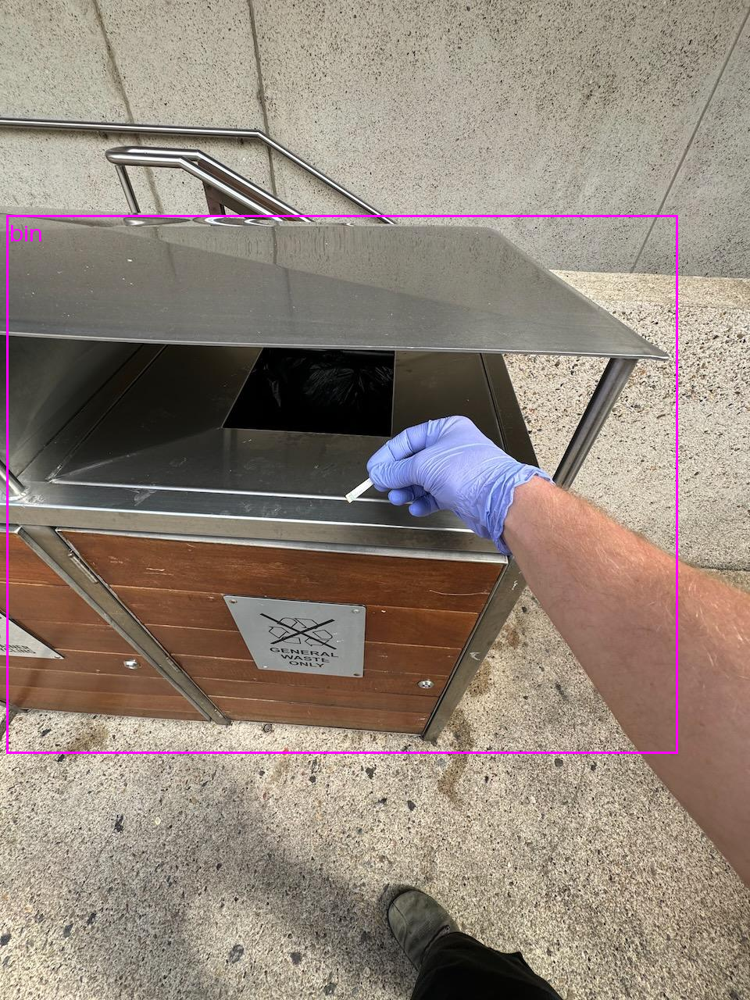

In [17]:
import torch

from torchvision.ops import box_convert
from torchvision.utils import draw_bounding_boxes

from torchvision.transforms.functional import pil_to_tensor, to_pil_image 

from PIL import ImageFont

# Image is a sample image from Trashify project: https://huggingface.co/spaces/mrdbourke/trashify_demo_v3 
image_path = "data/trashify_demo_image_for_box_format.jpeg"

# Open the image
image = Image.open(image_path)

# Get box coordinates in tensor form
box_xywh = torch.tensor(box_xywh)
print(f"[INFO] Box in XYWH format: {box_xywh}")

# Convert boxes from XYWH -> XYXY 
# torchvision.utils.draw_bounding_boxes requires input boxes in XYXY format (x_min, y_min, x_max, y_max)
box_xyxy = box_convert(boxes=box_xywh,
                       in_fmt="xywh",
                       out_fmt="xyxy")
print(f"[INFO] Box XYXY: {box_xyxy}")

# Draw the image as a tensor and then turn it into a PIL image
to_pil_image(
    pic=draw_bounding_boxes(
        image=pil_to_tensor(pic=image),
        boxes=box_xyxy.unsqueeze(0), # requires at least one extra dimension (e.g. [[x_min, y_min, x_max, y_max]])
        colors=[box_colour], # all parameters are expected in a list/tensor format
        labels=[box_label],
        width=3,
        # font=font_filename, # you can manually asign a font otherwise `PIL.ImageFont.load_default()` is used 
        font_size=30,
        label_colors=[box_colour]
    )
)

Voilà!

We get another image with a bounding box drawn on it, this time done with `torch` and `torchvision` (which use `PIL.ImageDraw` behind the scenes).

## Summary and extra resources

We've now been hands-on with six different formats of bounding boxes: 

1. Absolute `XYXY`.
2. Absolute `XYWH`.
3. Absolute `CXCYWH`.
4. Normalized `XYXY`.
5. Normalized `XYWH`.
6. Normalized `CXCYWH`.

There are probably more formats out there that I've missed.

But these should get you pretty far.

And now you've got the skills to interporlate through various forms on your own!

We also drew boxes on images in three different ways: using `PIL`, using `matplotlib` and using `torchvision`. 

For more on bounding boxes, I'd recommend the following: 

* For a similar guide to this one plus some information on bounding box augmentation (when you use data augmentation on object detection images, you need to be sure to augment the box too), see the [fantastic guide from the Albumentations library](https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/).
* For more on augmenting bounding boxes with `torchvision` see the [`torchvision.transforms.v2` end-to-end guide](https://pytorch.org/vision/stable/auto_examples/transforms/plot_transforms_e2e.html#sphx-glr-auto-examples-transforms-plot-transforms-e2e-py).
* For a great library to help you with all kinds of reusable computer vision tools, see the [Supervision library from Roboflow](https://supervision.roboflow.com/latest/how_to/detect_and_annotate/).
* For an interactive box drawing and formatting app, see the [Gradio demo I created on Hugging Face Spaces](https://huggingface.co/spaces/mrdbourke/bounding-box-demo) (or try it out below - best viewed on desktop).

<iframe
	src="https://mrdbourke-bounding-box-demo.static.hf.space"
	frameborder="0"
	width="750"
	height="1400"
></iframe>

Finally, it's good practice to try out what we've done on your own images.

So perhaps pick an image of your own, draw a box on it with a labelling tool (or in Photoshop or just by estimating pixel counts) and then plot it several different ways.

Happy detecting!